# Lab 5 - Kernel Methods

Dominik Gaweł

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/dg7s/Machine-Learning/blob/main/hw/Polynomial_Kernel_SVM_in_3D_Feature_Space.ipynb)
-------------------------------

# **Homework Assignment: Polynomial Kernel SVM in 3D Feature Space**
-------------------------------
You have seen how a polynomial kernel of degree 2 can map the original 2D data
$$(x_1, x_2)$$
to a 3D feature space via some transformation
$$
\phi(\mathbf{x}).
$$
You also saw that **the decision boundary** in the 3D space—expected to be a hyperplane—**appears** as a circular surface when visualized.

## **Primary Question**

**Why does the SVM's decision boundary in the higher-dimensional (3D) feature space *not* look like a “flat” hyperplane,**
even though we *know* the classifier’s separating surface *is* mathematically linear in that space?

## **Secondary Question**

Explain **why** a hyperplane in 3D becomes a **circular (or elliptical) curve** when viewed back in the original 2D plane of the dataset.

## **Task & Deliverables**

1. **Colab Notebook**  
   - Create a **Colab notebook** that:
     - Clearly **answers** both the **primary** and **secondary** questions with appropriate plots and short explanations.
     - Uses Python code to visualise and create plots.
   - Include a discussion (in markdown cells) illustrating the geometry behind the mapping
     $$\phi(\mathbf{x})$$
     and the resulting decision boundary.
   - Use
     `$` symbol to delimit inline equations and `$$` to delimit full-line equations.

2. **Publish on GitHub**  
   - Place the Colab notebook in your **GitHub repository** for this course.
   - In your repository’s **README**, add a **link** to the notebook and also include an **“Open in Colab”** badge at the top of the notebook so it can be launched directly from GitHub.




In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.svm import SVC
from sklearn.datasets import make_circles
import math
import matplotlib.pyplot as plt

## Primary Question

In the given code, we first computed decision values over a 2D grid using `clf.decision_function(grid)`, and then applied the polynomial kernel's explicit mapping:

$$
\phi(x) = [x_1^2, \sqrt{2}\,x_1 x_2, x_2^2]
$$

to transform both the grid and the original data into a 3D feature space. This transformation maps the 2D points onto a curved quadratic manifold in $\mathbb{R}^3$. As a result, the intersection of the hyperplane with our manifold is what we observe as a circle.

The code below calculates the weight vector $w$ and bias $b$ using the support vectors and their dual coefficients. These parameters define the decision hyperplane in the 3D feature space by the equation

$$
w_1 x + w_2 y + w_3 z + b = 0.
$$

We include plots of the full decision hyperplane, the manifold surface, and the transformed data points so that one can interactively explore how a flat hyperplane in $\mathbb{R}^3$ intersects with the curved manifold where the data lie.

In [ ]:
np.random.seed(42)
X, y = make_circles(n_samples=300, factor=0.5, noise=0.05)
y = np.where(y == 0, -1, 1)

clf = SVC(kernel='poly', degree=2, C=1.0, coef0=0, gamma=1)
clf.fit(X, y)

phi = lambda x: np.array([x[0]**2, np.sqrt(2)*x[0]*x[1], x[1]**2])
phi_X = np.array([phi(x) for x in X])

# Create a meshgrid
x_min, x_max = X[:, 0].min() - 0.2, X[:, 0].max() + 0.2
y_min, y_max = X[:, 1].min() - 0.2, X[:, 1].max() + 0.2
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500), np.linspace(y_min, y_max, 500))
grid = np.c_[xx.ravel(), yy.ravel()]
phi_grid = np.array([phi(x) for x in grid])

decision = clf.decision_function(grid)
contour_mask = np.isclose(decision, 0, atol=0.01)

# Transform meshgrid points to get the manifold surface in 3D
phi_manifold = np.array([phi([xx[i, j], yy[i, j]])
                         for i in range(xx.shape[0])
                         for j in range(xx.shape[1])])
phi_manifold = phi_manifold.reshape(xx.shape[0], xx.shape[1], 3)
manifold_x = phi_manifold[:, :, 0]
manifold_y = phi_manifold[:, :, 1]
manifold_z = phi_manifold[:, :, 2]

# Notice: clf.dual_coef_ is alpha_i * y_i in scikit-learn
sv = clf.support_vectors_
dual_coef = clf.dual_coef_.flatten()
phi_sv = np.array([phi(x) for x in sv])
phi_support = np.array([[sv[0]**2, np.sqrt(2)*sv[0]*sv[1], sv[1]**2] for sv in clf.support_vectors_])
w = np.sum(clf.dual_coef_.flatten()[:, None] * phi_support, axis=0)
b = clf.intercept_[0]

# Grid for the decision hyperplane
assert all(not math.isclose(x, 0, abs_tol=1e-9) for x in w[2].flatten())

z0_range = np.linspace(manifold_x.min()-1, manifold_x.max()+1, 50)
z1_range = np.linspace(manifold_y.min()-1, manifold_y.max()+1, 50)
Z0, Z1 = np.meshgrid(z0_range, z1_range)
Z2 = -(w[0]*Z0 + w[1]*Z1 + b) / w[2]

# Plot
fig = go.Figure()

colors = np.where(y == 1, 'red', 'blue')
fig.add_trace(go.Scatter3d(
    x=phi_X[:, 0], y=phi_X[:, 1], z=phi_X[:, 2],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.9),
    name='Data Points',
    showlegend=True
))


fig.add_trace(go.Surface(
    x=manifold_x, y=manifold_y, z=manifold_z,
    surfacecolor=np.full_like(manifold_x, 0),
    colorscale=[[0, '#D8BFD8'], [1, '#D8BFD8']],
    opacity=0.7,
    showscale=False,
    name='Manifold',
    showlegend=True
))

fig.add_trace(go.Scatter3d(
    x=phi_grid[contour_mask, 0],
    y=phi_grid[contour_mask, 1],
    z=phi_grid[contour_mask, 2],
    mode='markers',
    marker=dict(size=3, color='#000000'),
    name='Decision Boundary',
    showlegend=True
))

fig.add_trace(go.Surface(
    x=Z0, y=Z1, z=Z2,
    colorscale=[[0, '#26A69A'], [1, '#26A69A']],
    opacity=0.5,
    showscale=False,
    name='Decision Hyperplane',
    showlegend=True
))

fig.update_layout(
    title='SVM with Polynomial Kernel: φ(x)-space Visualization',
    scene=dict(
        xaxis_title='$x_1^2$',
        yaxis_title='$\\sqrt{2} x_1 x_2$',
        zaxis_title='$x_2^2$',
    ),
    width=900,
    height=700,
    showlegend=True
)

fig.show()


## Secondary Question

The linear decision boundary in the transformed 3D space is given by

$$w_1 x_1^2 + w_2 \sqrt{2}\, x_1 x_2 + w_3 x_2^2 + b = 0.$$

The equation represents a **conic section** in the original 2D space. Depending on the values of the coefficients $w_1$, $w_2$, $w_3$, and $b$, this conic section may be:

- a **circle**,
- an **ellipse**,
- a **parabola**,
- a **hyperbola**.

For our dataset, the decision boundary appears as a circle or ellipse.

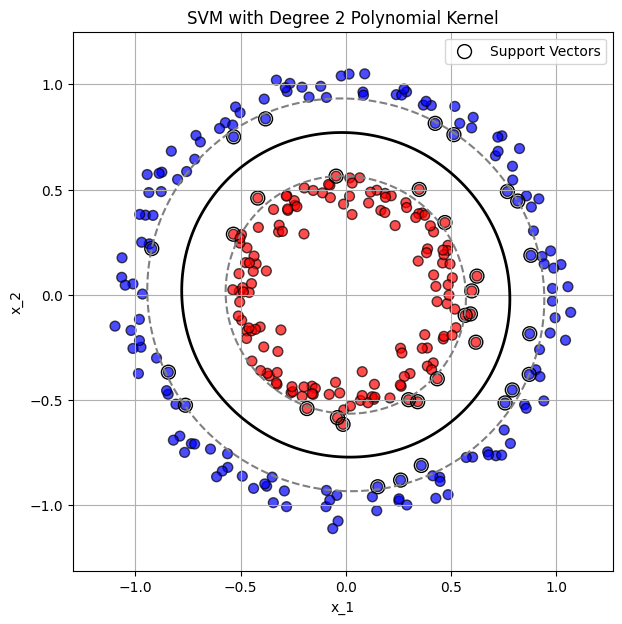

In [ ]:
decision = decision.reshape(xx.shape)

plt.figure(figsize=(10, 7))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr', edgecolors='k', s=50, alpha=0.7)

plt.contour(xx, yy, decision, levels=[0], linewidths=2, colors='k')
plt.contour(xx, yy, decision, levels=[-1, 1], linestyles='--', colors='grey')

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
            s=100, linewidth=1, facecolors='none', edgecolors='k', label='Support Vectors')

plt.title('SVM with Degree 2 Polynomial Kernel')
plt.xlabel('x_1')
plt.ylabel('x_2')
plt.legend()
plt.grid(True)

plt.gca().set_aspect('equal')
plt.show()